<center>
    
## Aprendizaje No Supervisado DiploDatos
    Laura Alonso Alemany, Ana Georgina Flesia y Valeria Rulloni
## Agrupamiento con el FIFA 2021 dataset
 


## 1.-Inicialización-del-entorno

Empezamos cargando algunas herramientas para cargar los datos y manipularlos.

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

In [ ]:
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import seaborn as sns
from collections import Counter

In [ ]:
from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition
from sklearn import (manifold, preprocessing, decomposition)
from sklearn.cluster import AgglomerativeClustering

## 2.-Preparación-de-los-datos y exploración de la base

Cargamos los datos bajados de la database de [Kaggle](https://www.kaggle.com/karangadiya/fifa19) como 'data.csv'. 

In [ ]:
Data_Link = 'https://raw.githubusercontent.com/sase1988/IANS/master/players_21.csv'

df=pd.read_csv(Data_Link, sep=',')

In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,...,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,#Dribbler #Distance Shooter #FK Specialist #Ac...,CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,Finesse Shot Long Shot Taker (AI) Speed Dribbl...,85,95,70,91,...,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,#Aerial Threat #Dribbler #Distance Shooter #Ac...,LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,Power Free-Kick Flair Long Shot Taker (AI) Spe...,84,95,90,82,...,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,90.0,52.0,90.0,GK Long Throw Comes For Crosses,13,11,15,43,...,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,#Distance Shooter #Clinical Finisher,ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,Solid Player Finesse Shot Outside Foot Shot Ch...,71,94,85,84,...,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,90000000,270000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,166500000.0,#Speedster #Dribb

In [ ]:
df.defending_sliding_tackle

0        24
1        24
2        18
3        19
4        29
         ..
18939    54
18940    47
18941    45
18942    45
18943    45
Name: defending_sliding_tackle, Length: 18944, dtype: int64

**Preparamos la base para Clustering:**

**Retiramos jugadores con bajo Desempeño global ("Overall")**

**y consideramos Variables de desempeño por habilidad (skills_ratings)**

In [ ]:
# Referencias del significado de cada habilidad
# https://www.fifplay.com/encyclopedia/
n=10000
df_n=df.loc[:n] #los primeros n
df_n=df_n[(df_n['overall']>70)] # mejores jugadores

skills_ratings = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing',
                  'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
                  'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions',
                  'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
                  'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 
                  'mentality_composure', 'defending_standing_tackle', 'defending_sliding_tackle',
                  'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']

print(len(skills_ratings), 'variables numéricas: skills/habilidades')

df_skills=df_n[skills_ratings]

33 variables numéricas: skills/habilidades


## 2.1-Descripcion del dataset

La archivo contiene 106 features sobre los 18.944 jugadores disponibles en el juego FIFA. Entre las características más importantes podemos mencionar:

Identificación unívoca del jugador - (4): estos campos identifcan y describen al jugador con datos personales	

Datos fisicos y demográficos del jugador (5) - age: describen características físicas y demográficas. (dob	height_cm	weight_kg	nationality)

Descriptores y valoración del club (3) - aportan datos sobre el club para el cual se desempeña el jugador

Valoración general del jugador (3) - - Son características que podrían derivar datos sobre la calidad del jugador en términos generales. Salario, Valor, Potencial
overall	potential	value_eur	wage_eur

Características del tipo de juego del jugador (8) - Estos campos identifican al jugar desde el punto de vista de su estilo de juego y posición en la cancha.
player_positions	preferred_foot	international_reputation	weak_foot	skill_moves,nation_position	nation_jersey_number, player_traits

Datos del contrato de cada jugador (3)- 
loaned_from	joined	contract_valid_until

Habilidades - 33 Características. A cada jugador se le asigna un puntaje relativo a su desempeño en cada habilidad. Por ejemplo, control de balón, salto, precisión,etc


## 2.2-Exploración de la base

Visualizamos los datos de a dos variables numéricas


In [ ]:
def get_skill_index(skill_of_interest,skill_list):
  for i,skill in enumerate(skill_list):
    if skill == skill_of_interest:
      return i

In [ ]:
skill = 'defending_standing_tackle'
skill_i = get_skill_index(skill,skills_ratings )

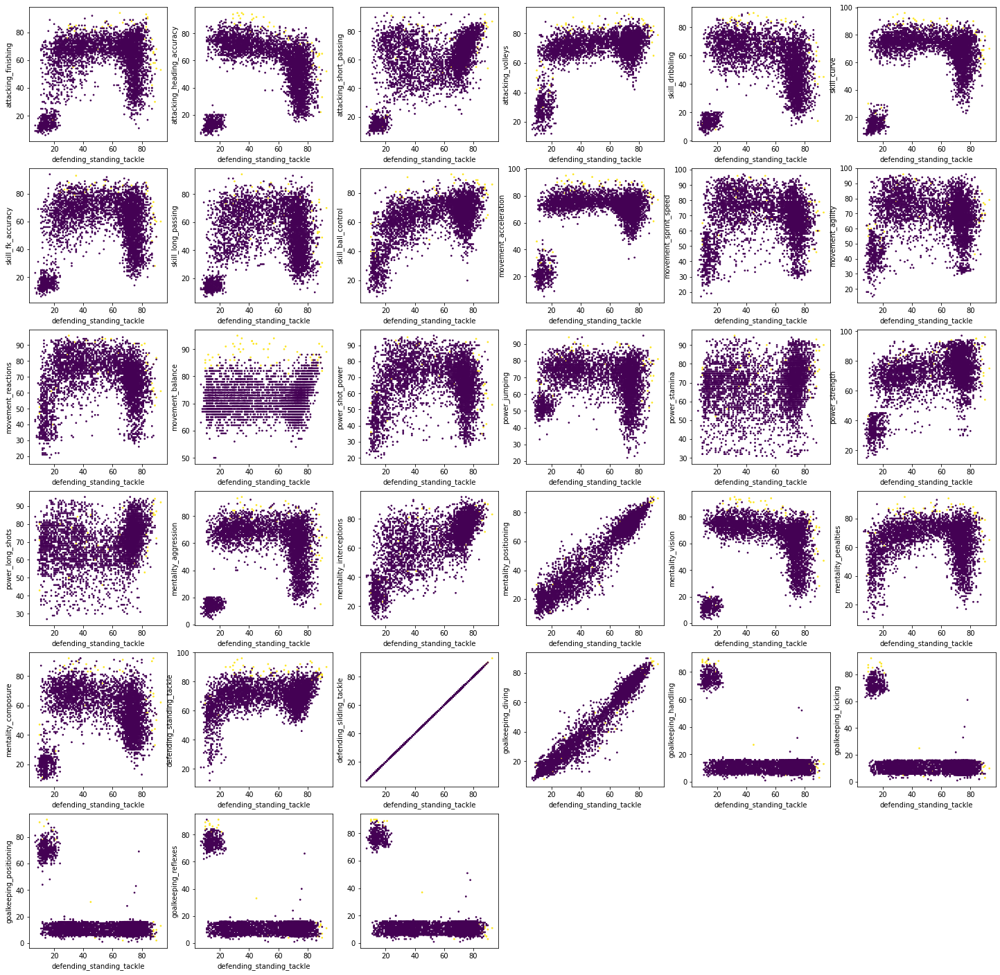

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    plt.scatter(df_skills[skill_1], y=df_skills[skill_2],s=3,c=bool_crack)
    
plt.show()

In [ ]:
#Elejimos dos variables, para esto elejimos dos números entre 0 y  de n_skills-1

skill_1= 'skill_dribbling'
skill_2= 'mentality_vision'

In [ ]:
graf1 = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'club_name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[graf1,crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=700,height=700)

fig = go.Figure(data=data, layout=layout)


In [ ]:
fig.show(renderer="colab")

### Interpretacion:

Se observa que en la comparacion de varias skills entre si ya se separan claramente a dos grupos, los arqueros y el resto de los jugadores. La clara distincion de los arqueros se debe a que tienen un comportamiento completamente distinto al resto en el juego, mostrado en el dataset por valores diferentes en ciertas skills.

# 3.-Clustering-con-Kmeans

Es necesario definirle la cantidad de grupos/clusters (n_clusters), es un hiperparámetro del algoritmo. 


**Elección de la cantidad de grupos/clusters**

Una forma de seleccionar la cantidad más adecuada de clusters es probar varias cantidades y usar el criterio del codo: "elbow method", utilizando una medida de ajuste que puede ser Inertia.

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

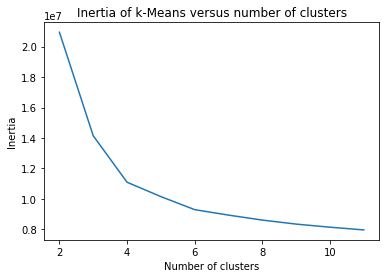

In [ ]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(df_skills).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

Utilizando este método, se decide en dividir el dataset en 4 clusters ya que a partir de 5 en adelante no tenemos ganancias significativas en la inertia por incrementar la cantidad de clusters. En otras palabras, estaríamos complejisando el modelo sin obtener agrupaciones significativamente mejores


In [ ]:
# Número de clusters buscado
n_clust = 4

km = KMeans(n_clusters=n_clust)
km.fit(df_skills) #utiliza todas las habilidades: 34 dimensiones

# Recuperacion de etiquetas
clusters = km.labels_
print('Suma de los cuadrados de las distancias al cluster=Inertia= ', km.inertia_)

Suma de los cuadrados de las distancias al cluster=Inertia=  11098843.289651643


**Graficamos el resultado de agrupar a los jugadores usando kmedias con la cantidad de clases elegida: Visualizamos de a dos variables por vez**

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1= 'defending_standing_tackle'
skill_2= 'mentality_penalties'

In [ ]:
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab:
fig.show(renderer="colab")

**Graficamos el mismo resultado, pero utilizando t-SNE para reducir las 34 dimensiones a 2. Podemos notar que la división entre clusters es bastante buenaya que no se notan puntos mezclados entre los distintos grupos**

  

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4512 samples in 0.018s...
[t-SNE] Computed neighbors for 4512 samples in 0.851s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4512
[t-SNE] Computed conditional probabilities for sample 2000 / 4512
[t-SNE] Computed conditional probabilities for sample 3000 / 4512
[t-SNE] Computed conditional probabilities for sample 4000 / 4512
[t-SNE] Computed conditional probabilities for sample 4512 / 4512
[t-SNE] Mean sigma: 12.235446
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.564102
[t-SNE] KL divergence after 1000 iterations: 1.772644


In [ ]:
kmean_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="K means - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab:
fig.show(renderer="colab")

In [ ]:
df_clusters=df_n.copy()
df_clusters['kmeans'] = km.labels_ #clusters
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')

Kmeans encontró:  4 clusters, nosotros forzamos la cantidad


**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los clusters, usando las clases asignadas por kmeans** 
- Cantidad de observaciones por Cluster
- Análisis descriptivo separando por Cluster
- Tabla de contingencia alguna categórica vs clusters
- Silohuette?


In [ ]:
#Observaciones por cluster
df_clusters["kmeans"].value_counts()


3    1681
0    1466
2     921
1     444
Name: kmeans, dtype: int64

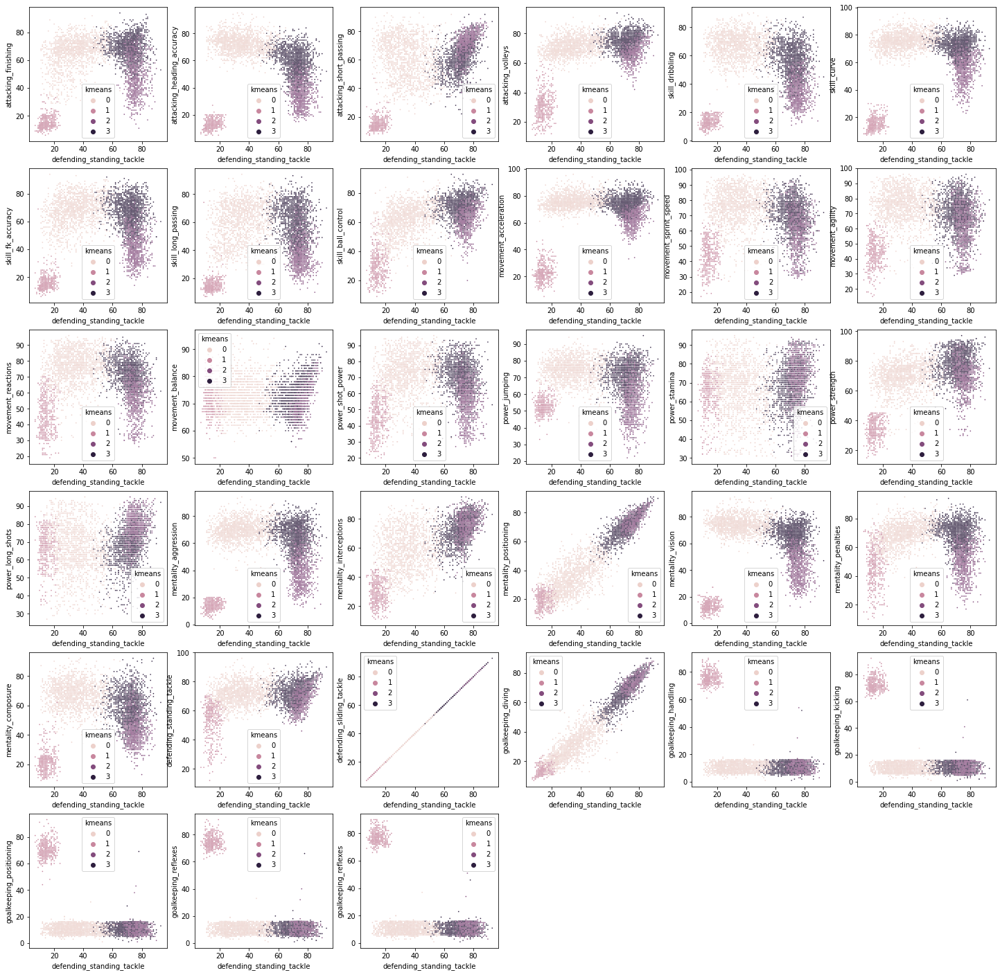

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_clusters[skill_1], y=df_clusters[skill_2],s=3,c=bool_crack, hue = df_clusters['kmeans'], cmap = 'hsv_r')
    
plt.show()

Para n_clusters = 2 El silhouette_score promedio es : 0.6413157990914239
Para n_clusters = 3 El silhouette_score promedio es : 0.3368735183485735
Para n_clusters = 4 El silhouette_score promedio es : 0.30988045957867183
Para n_clusters = 5 El silhouette_score promedio es : 0.2774150713305208
Para n_clusters = 6 El silhouette_score promedio es : 0.23810817661502381


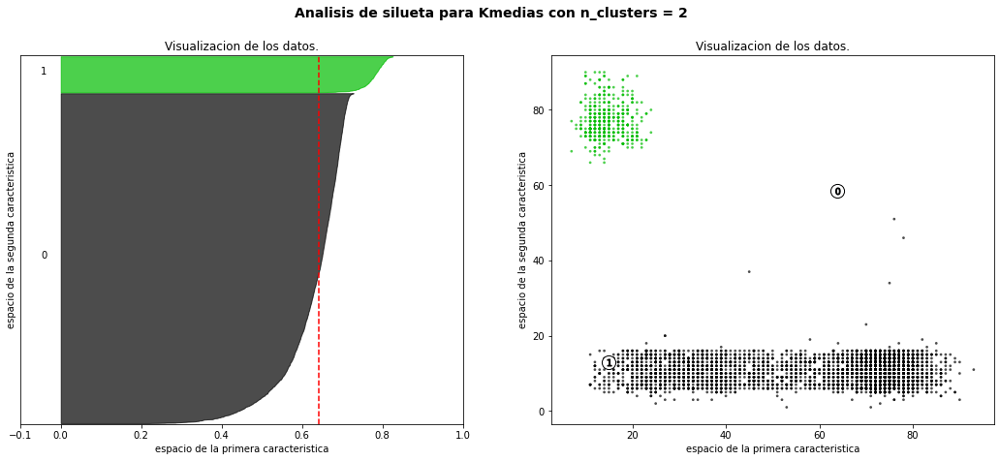

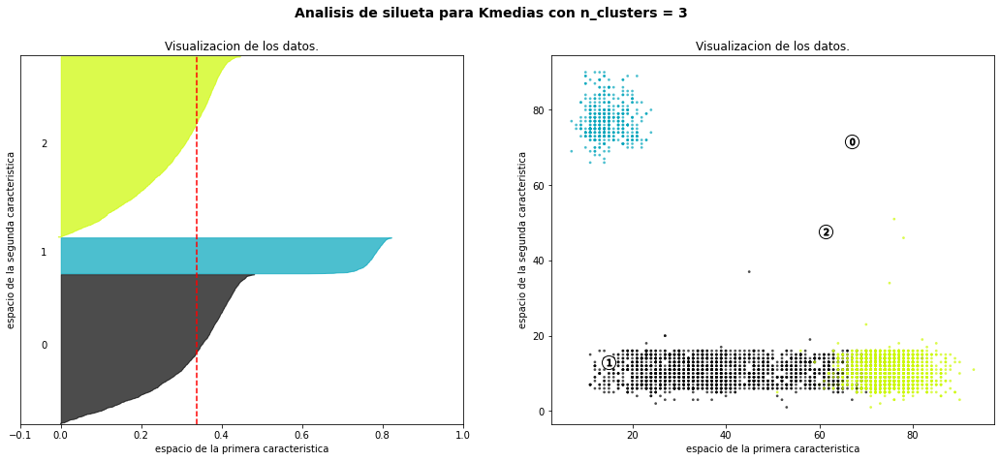

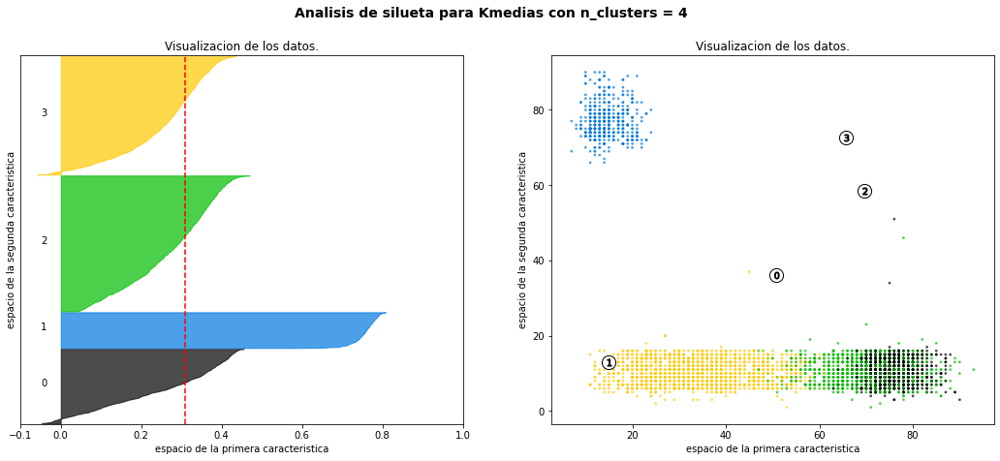

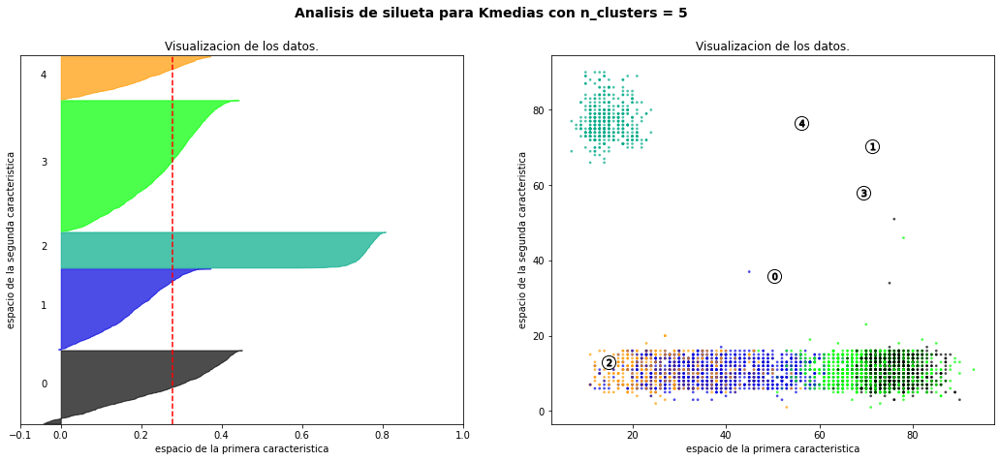

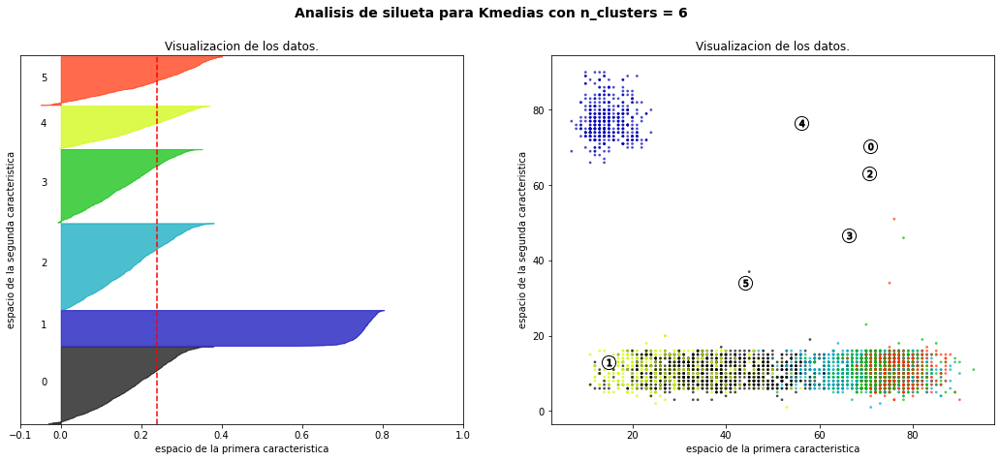

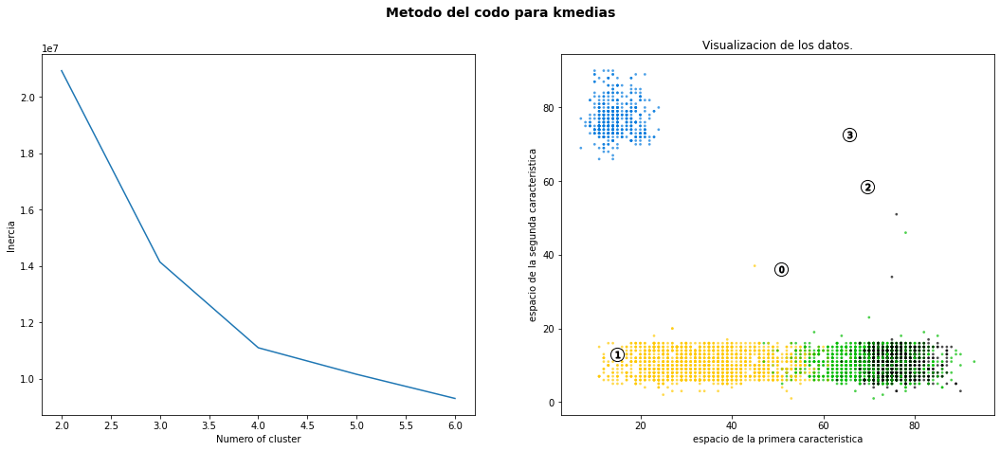

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_skills)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para kmedias "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

### Resultados

**El análisis de silueta con distintos clusters no muestra resultados similares, tanto para la division en 2, 3 y 4, clusters. Con distribuciones homogeaneas y practicamente sin valores negativos. Se denota muy bien como el conjunto de los arqueros conforma un cluster claramente separable por k-means.**

**Para los demas valores la sluetas son irregulares y con mas cantidad de valores negativos.** 


In [ ]:
temp = df_clusters[bool_crack].groupby('kmeans').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  kmean_group = row.kmeans
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {kmean_group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {kmean_group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['L. Messi', 'Cristiano Ronaldo', 'R. Lewandowski', 'Neymar Jr', 'K. Mbappé']
Posiciones mayoritarias dentro del cluster 0
['LW', 'ST', 'CAM']

Ejemplo de "cracks" en cluster 1
['J. Oblak', 'M. ter Stegen', 'Alisson', 'T. Courtois', 'M. Neuer']
Posiciones mayoritarias dentro del cluster 1
['GK']

Ejemplo de "cracks" en cluster 2
['K. Koulibaly', 'A. Laporte', 'G. Chiellini', 'R. Varane']
Posiciones mayoritarias dentro del cluster 2
['LCB', 'RCB']

Ejemplo de "cracks" en cluster 3
['K. De Bruyne', 'V. van Dijk', 'Sergio Ramos', 'Casemiro', 'J. Kimmich']
Posiciones mayoritarias dentro del cluster 3
['RCM', 'RDM', 'LCB']



# 4.-Clustering-Mean-Shift 

- NO es necesario definirle la cantidad de grupos/clusters
- NO es escalable, computacionalmente es muy pesado. Cada dato tienen un proceso iterativo en donde en cada iteración considera los vecinos a menos de un radio de distancia.
- Hipeparámetros: radio/bandwith (de cobertura para cálculo de media). (Probar con varios)

















































































In [ ]:
ms = MeanShift(bandwidth=2, bin_seeding=True)

ms.fit(df_skills)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 3


Graficamos los resultados:

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
# skill_1=skills_ratings[5]
# skill_2=skills_ratings[14]

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

**Graficamos los mismos resultados, pero proyectados con t-SNE**

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
df_clusters['MeanShift'] = ms.labels_ #clusters2
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros lo forzamos')
print('Mean shift encontró ', max(ms.labels_)+1, 'clusters, según los hiperparámetros elegidos')

Kmeans encontró:  4 clusters, nosotros lo forzamos
Mean shift encontró  3 clusters, según los hiperparámetros elegidos


**EVALUACIÓN**

**EJERCICIO EN GRUPO: Análisis exploratorio de los clusters, usando las clases asignadas por MeanShift** 

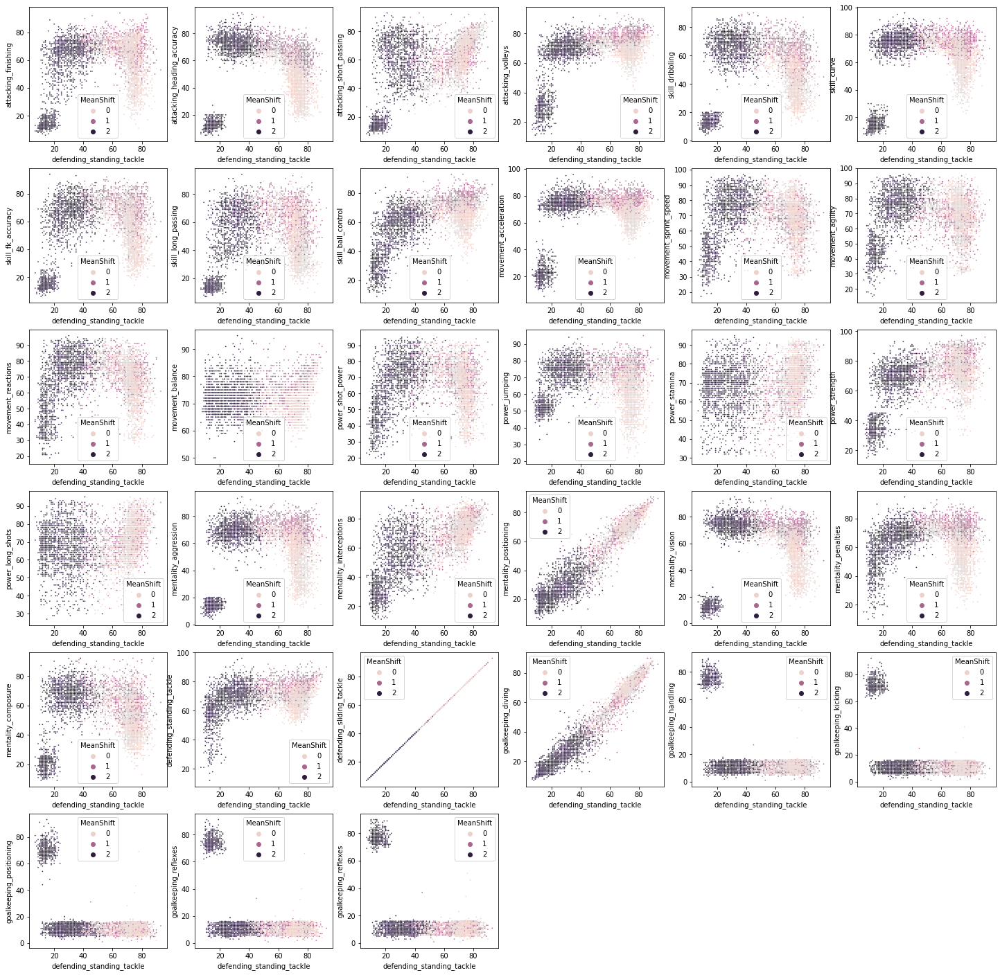

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_clusters[skill_1], y=df_clusters[skill_2],s=3,c=bool_crack, hue = df_clusters['MeanShift'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
#Observaciones por cluster
df_clusters["MeanShift"].value_counts()


0    1975
2    1599
1     938
Name: MeanShift, dtype: int64

In [ ]:
silhouette_avg = silhouette_score(df_skills, ms.labels_)
print("El silhouette_score promedio es :", silhouette_avg)

El silhouette_score promedio es : 0.04524089402228348


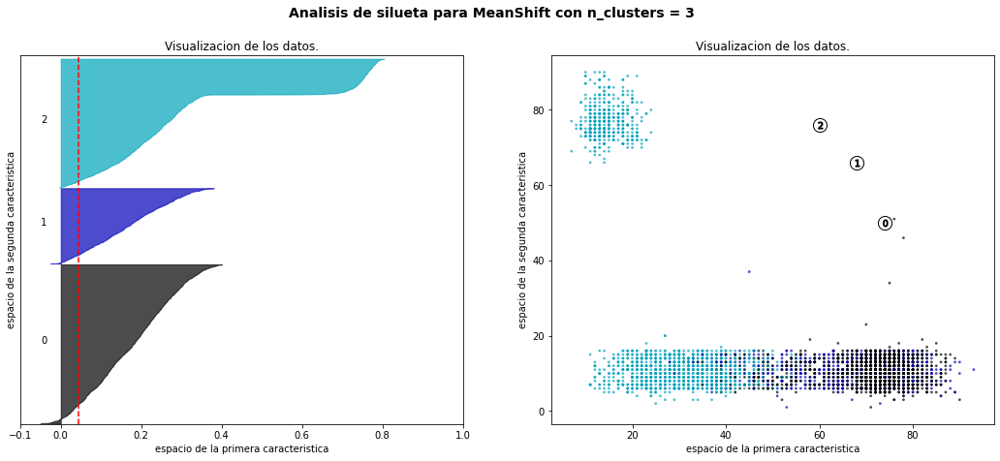

In [ ]:
# Create a subplot with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

y_lower = 10
for i in range(max(ms.labels_)+1):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[ms.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("Visualizacion de los datos.")
ax1.set_xlabel("espacio de la primera caracteristica")
ax1.set_ylabel("espacio de la segunda caracteristica")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(ms.labels_.astype(float) / n_clusters)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
            c = colors,edgecolor='k')

# Labeling the clusters
centers = ms.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

plt.suptitle(("Analisis de silueta para MeanShift "
              "con n_clusters = %d" % (max(ms.labels_)+1)),
              fontsize=14, fontweight='bold')
#plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

### Resultados

**La prueba de la silueta muestra clusters muy irregulares y con valores negativos. Indicando que no es la mejor separacion posible de este conjunto de datos. Incluso no logra diferenciar bien a los arqueros.**

In [ ]:
temp = df_clusters[bool_crack].groupby('MeanShift').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  group = row.MeanShift
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['K. Koulibaly', 'G. Chiellini', 'R. Varane']
Posiciones mayoritarias dentro del cluster 0
['LCB', 'RCB']

Ejemplo de "cracks" en cluster 1
['K. De Bruyne', 'V. van Dijk', 'Sergio Ramos', 'Casemiro', 'J. Kimmich']
Posiciones mayoritarias dentro del cluster 1
['RCM', 'LCB', 'RDM']

Ejemplo de "cracks" en cluster 2
['L. Messi', 'Cristiano Ronaldo', 'J. Oblak', 'R. Lewandowski', 'Neymar Jr']
Posiciones mayoritarias dentro del cluster 2
['GK', 'LW', 'RS']



# 5.-Clustering-con-Kmeans-sin-arqueros

In [ ]:
# Eliminamos a los arqueros (GK)

df_n.player_positions

0       RW, ST, CF
1           ST, LW
2               GK
3               ST
4          LW, CAM
           ...    
4507        RM, RB
4508            RM
4509            CM
4510            GK
4511           CDM
Name: player_positions, Length: 4512, dtype: object

In [ ]:
n=10000
df_n=df.loc[:n]
df_n=df_n[(df_n["player_positions"]!='GK')&(df_n['overall']>69)]


df_skills=df_n[skills_ratings]


Determinamos el numero de cluster utilizando el metodo del codo

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

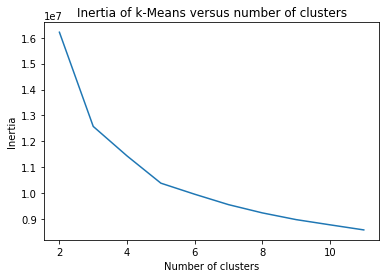

In [ ]:
scores = [KMeans(n_clusters=i).fit(df_skills).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [ ]:
# Número de clusters que obtenemos es 5
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(df_skills)

# Recuperacion de etiquetas
clusters = km.labels_

In [ ]:
df_n['Kmeans_SA'] = clusters

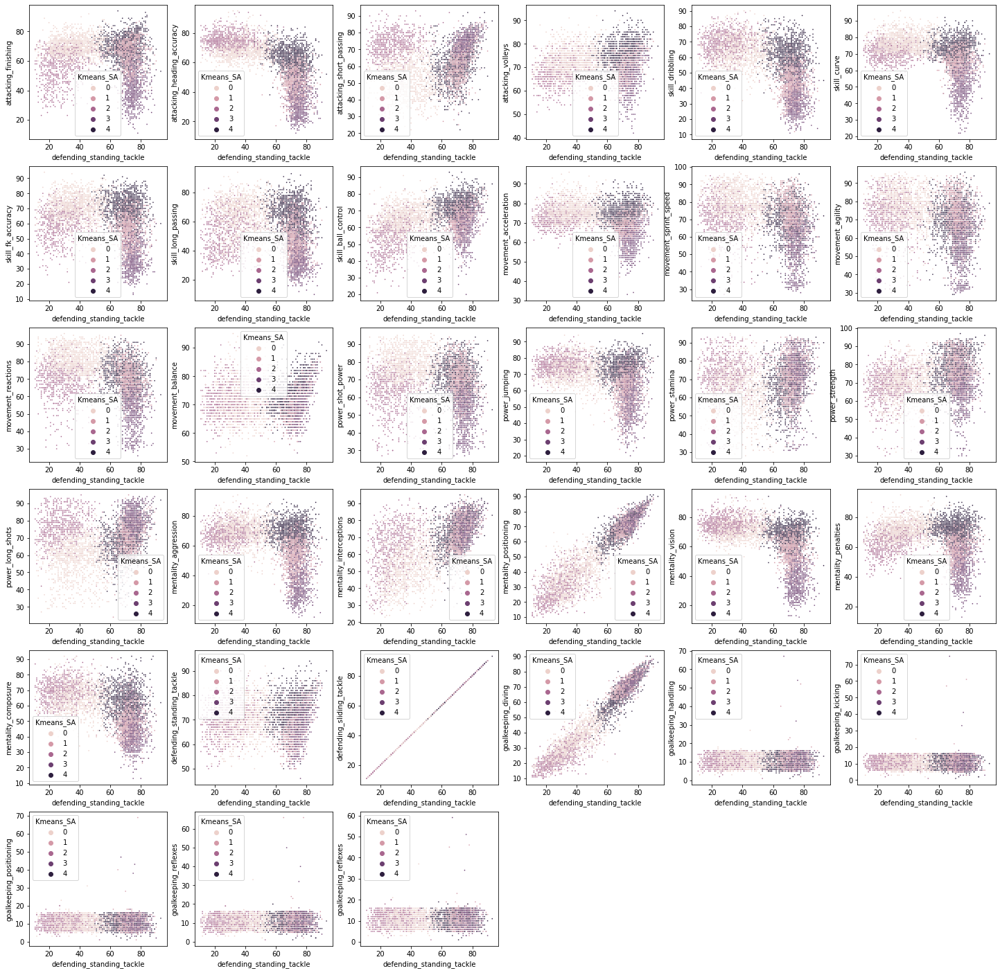

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Kmeans_SA'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
#data=[]
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1= 'defending_standing_tackle'
skill_2= 'attacking_finishing'

In [ ]:
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
# Reduccion de dimensionalidad con t-SNE
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4869 samples in 0.019s...
[t-SNE] Computed neighbors for 4869 samples in 1.095s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4869
[t-SNE] Computed conditional probabilities for sample 2000 / 4869
[t-SNE] Computed conditional probabilities for sample 3000 / 4869
[t-SNE] Computed conditional probabilities for sample 4000 / 4869
[t-SNE] Computed conditional probabilities for sample 4869 / 4869
[t-SNE] Mean sigma: 11.844459
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.479202
[t-SNE] KL divergence after 1000 iterations: 1.940411


In [ ]:
kmean_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="K means - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

Para n_clusters = 2 El silhouette_score promedio es : 0.28225596248959156
Para n_clusters = 3 El silhouette_score promedio es : 0.2556874995511751
Para n_clusters = 4 El silhouette_score promedio es : 0.22067305269674817
Para n_clusters = 5 El silhouette_score promedio es : 0.1805871553232471
Para n_clusters = 6 El silhouette_score promedio es : 0.1593550196151605


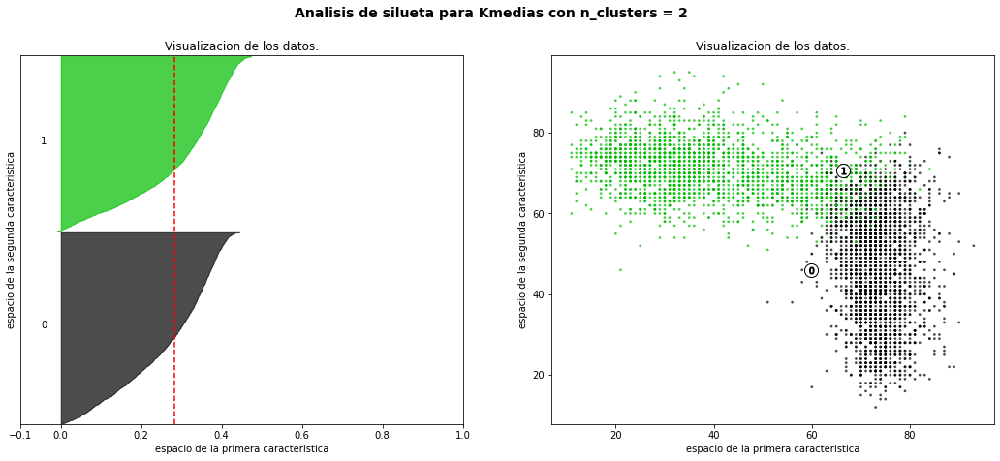

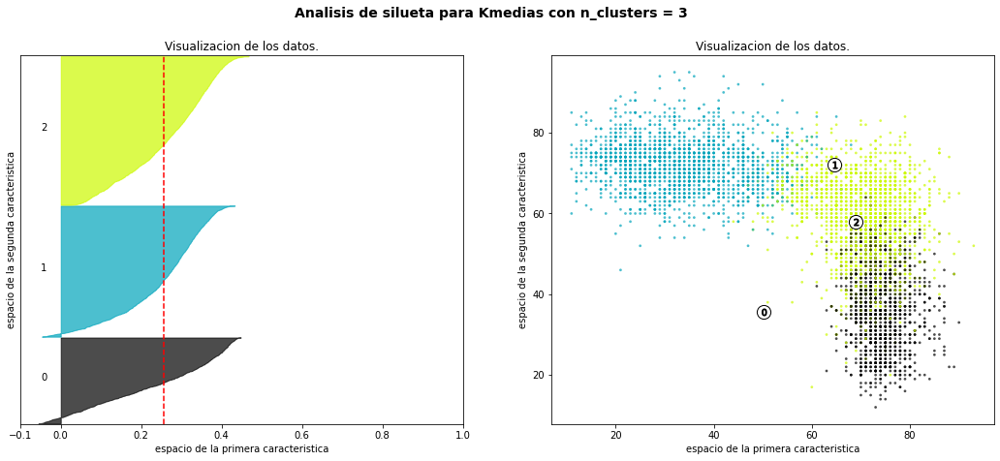

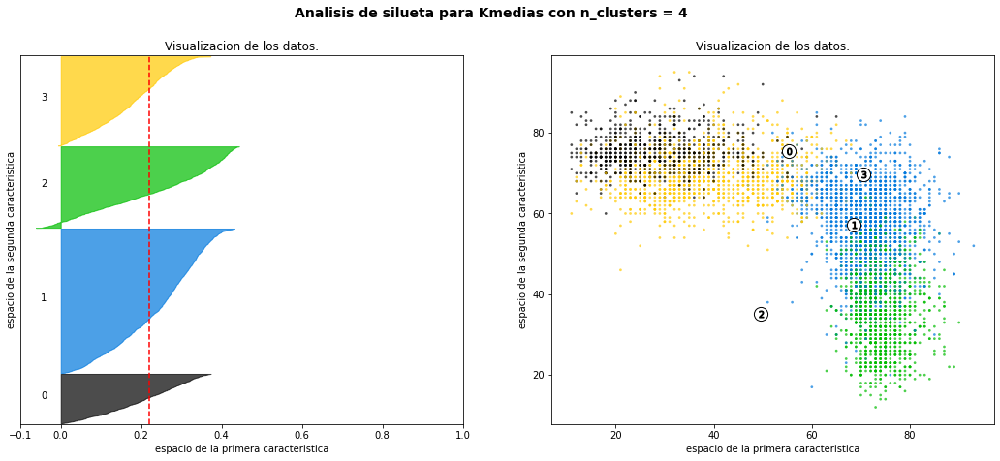

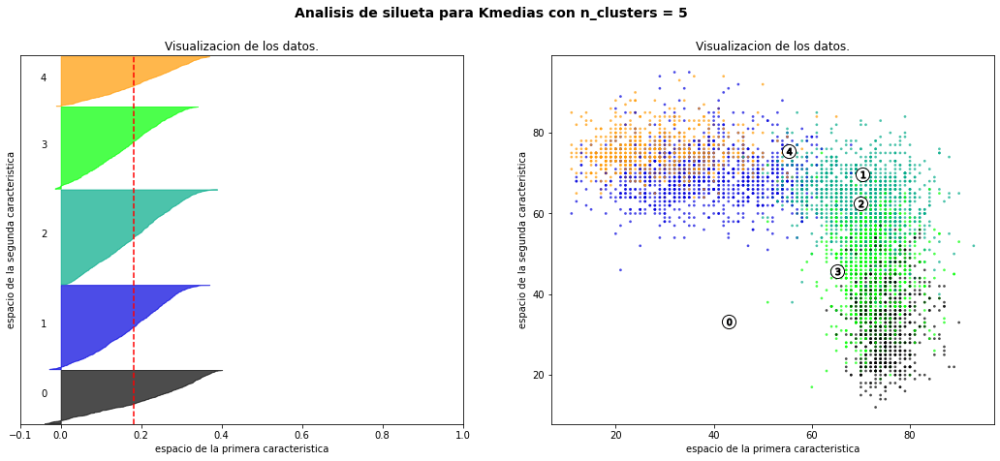

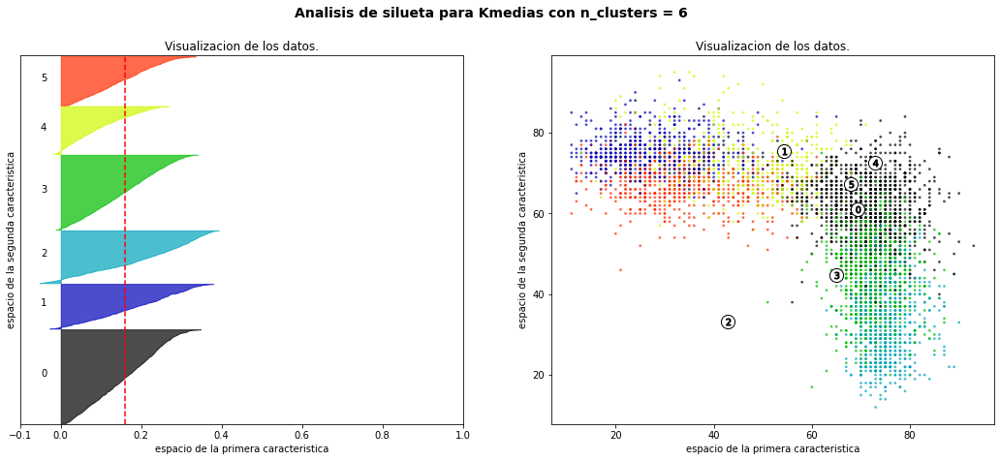

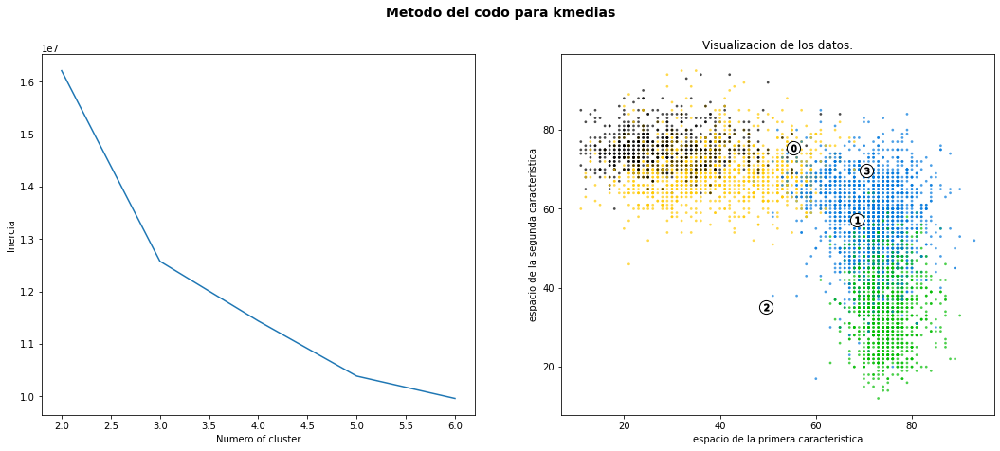

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_skills)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para kmedias "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

### Resultados

**Para el dataset sin arqueros la prueba de silueta muestra figuras uniformes tanto para un division en 2, 3 o 5 clusters. Con pocos o ningun valor negativo.**

**Pero el codo es mas "marcado" en 5, por lo cual se decidio que ese era el numero más acorde para subdividir este dataset.**

In [ ]:
temp = df_n[bool_crack].groupby('Kmeans_SA').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  group = row.Kmeans_SA
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['L. Messi', 'Cristiano Ronaldo', 'Neymar Jr', 'K. Mbappé', 'S. Mané']
Posiciones mayoritarias dentro del cluster 0
['LW', 'CAM', 'LS']

Ejemplo de "cracks" en cluster 1
['A. Laporte', 'R. Varane', 'Piqué', 'Carvajal']
Posiciones mayoritarias dentro del cluster 1
['RCB', 'LCB', 'RB']

Ejemplo de "cracks" en cluster 2
['R. Lewandowski', 'K. Benzema', 'H. Kane', 'C. Immobile', 'J. Vardy']
Posiciones mayoritarias dentro del cluster 2
['ST', 'CF', 'RS']

Ejemplo de "cracks" en cluster 3
['K. Koulibaly', 'G. Chiellini']
Posiciones mayoritarias dentro del cluster 3
['LCB']

Ejemplo de "cracks" en cluster 4
['K. De Bruyne', 'V. van Dijk', 'Sergio Ramos', 'Casemiro', 'J. Kimmich']
Posiciones mayoritarias dentro del cluster 4
['RCM', 'RDM', 'LCB']



# 6.-Clustering-Mean-Shift-sin-arqueros 

In [ ]:
ms = MeanShift()
ms.fit(df_skills)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Numero de clusters encontrado por Mean Shift : %d" % n_clusters_)

Numero de clusters encontrado por Mean Shift : 3


In [ ]:
df_n['MeanShift_SA'] = ms.labels_

In [ ]:
#Observaciones por cluster
df_n["MeanShift_SA"].value_counts()

0    4781
1      87
2       1
Name: MeanShift_SA, dtype: int64

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1='defending_standing_tackle'
skill_2= 'attacking_finishing'

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
# Con t-SNE
MeanShift_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

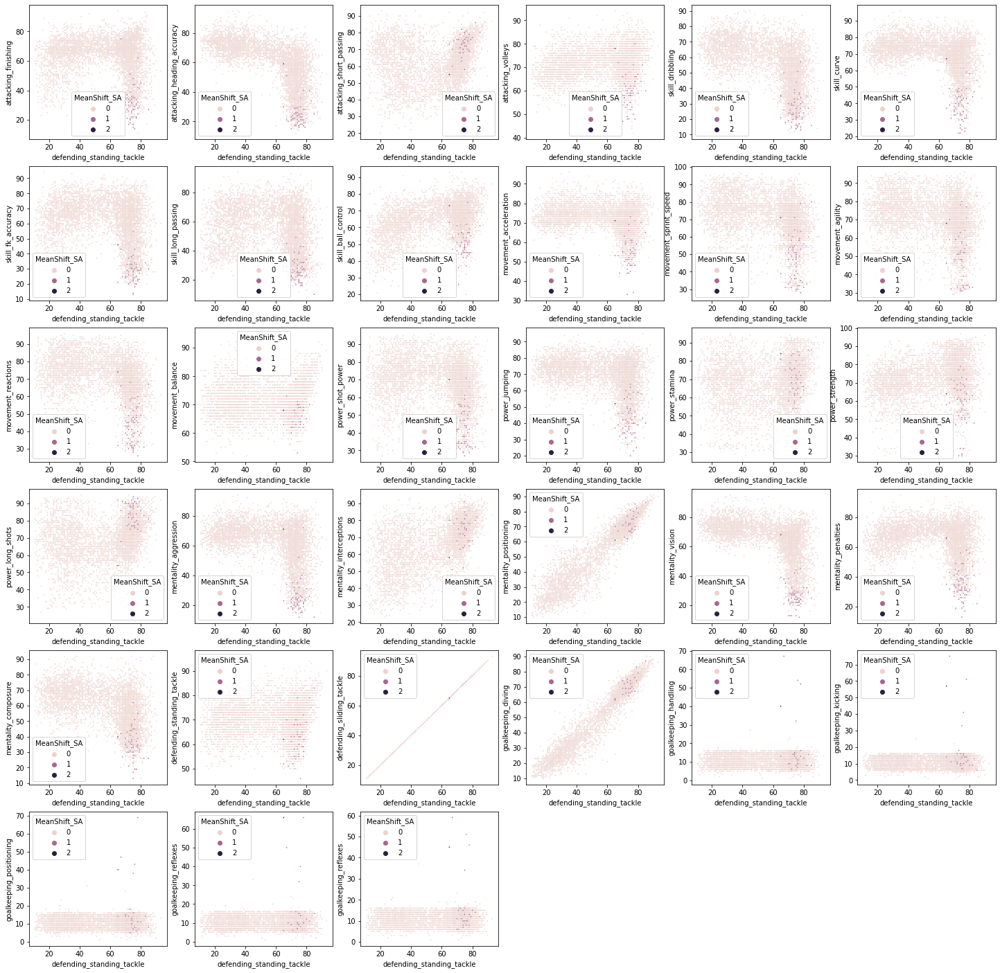

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['MeanShift_SA'], cmap = 'hsv_r')
    
plt.show()


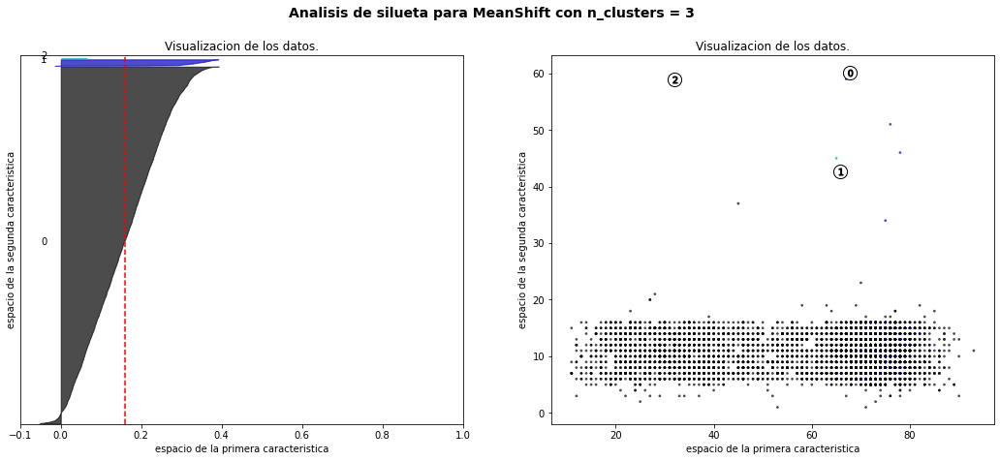

In [ ]:
# Create a subplot with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

y_lower = 10
for i in range(max(ms.labels_)+1):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[ms.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("Visualizacion de los datos.")
ax1.set_xlabel("espacio de la primera caracteristica")
ax1.set_ylabel("espacio de la segunda caracteristica")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(ms.labels_.astype(float) / n_clusters)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
            c = colors,edgecolor='k')

# Labeling the clusters
centers = ms.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

plt.suptitle(("Analisis de silueta para MeanShift "
              "con n_clusters = %d" % (max(ms.labels_)+1)),
              fontsize=14, fontweight='bold')
#plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

### Resultados

**A MeanShift le costó diferenciar clusters, prácticamente juntó a todas las observaciones en el mismo**

In [ ]:
temp = df_n[bool_crack].groupby('MeanShift_SA').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  group = row.MeanShift_SA
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['L. Messi', 'Cristiano Ronaldo', 'R. Lewandowski', 'Neymar Jr', 'K. De Bruyne']
Posiciones mayoritarias dentro del cluster 0
['LW', 'LCB', 'CAM']



# 7.-Clustering-con-Agglomerative

In [ ]:
n=10000
df_n=df.loc[:n] #los primeros n
df_n=df_n[(df_n['overall']>70)] # mejores jugadores


df_skills=df_n[skills_ratings]

In [ ]:
# Número de clusters buscado (mantenemos los valores encontrados con kmeans con el método del codo)
n_clust = 4

clustering = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
clustering.fit(df_skills)

clusters = clustering.labels_
#cluster_centers = clustering.cluster_centers_

labels_unique = np.unique(clusters)
n_clusters_ = len(labels_unique)

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

In [ ]:
df_n['Agglomerative'] = clustering.labels_

In [ ]:
#Observaciones por cluster
df_n["Agglomerative"].value_counts()

1    3447
0     615
3     444
2       6
Name: Agglomerative, dtype: int64

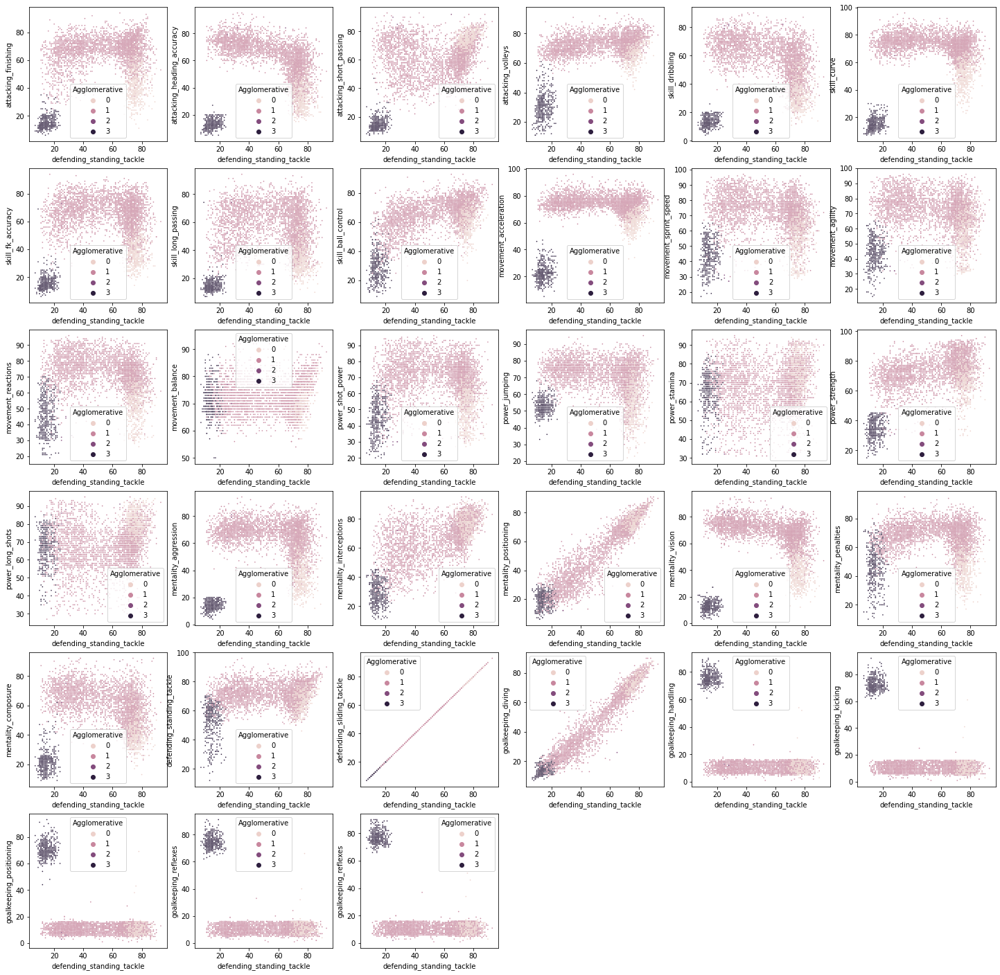

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Agglomerative'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
Agglomerative_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[Agglomerative_clusters,crack]

layout = go.Layout(title="Agglomerative",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4512 samples in 0.023s...
[t-SNE] Computed neighbors for 4512 samples in 0.867s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4512
[t-SNE] Computed conditional probabilities for sample 2000 / 4512
[t-SNE] Computed conditional probabilities for sample 3000 / 4512
[t-SNE] Computed conditional probabilities for sample 4000 / 4512
[t-SNE] Computed conditional probabilities for sample 4512 / 4512
[t-SNE] Mean sigma: 12.235446
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.549088
[t-SNE] KL divergence after 1000 iterations: 1.775572


In [ ]:
agglom_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[agglom_clusters,crack]

layout = go.Layout(title="Agglomerative - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

Para n_clusters = 2 El silhouette_score promedio es : 0.288918405818288
Para n_clusters = 3 El silhouette_score promedio es : 0.288918405818288
Para n_clusters = 4 El silhouette_score promedio es : 0.288918405818288
Para n_clusters = 5 El silhouette_score promedio es : 0.288918405818288
Para n_clusters = 6 El silhouette_score promedio es : 0.288918405818288


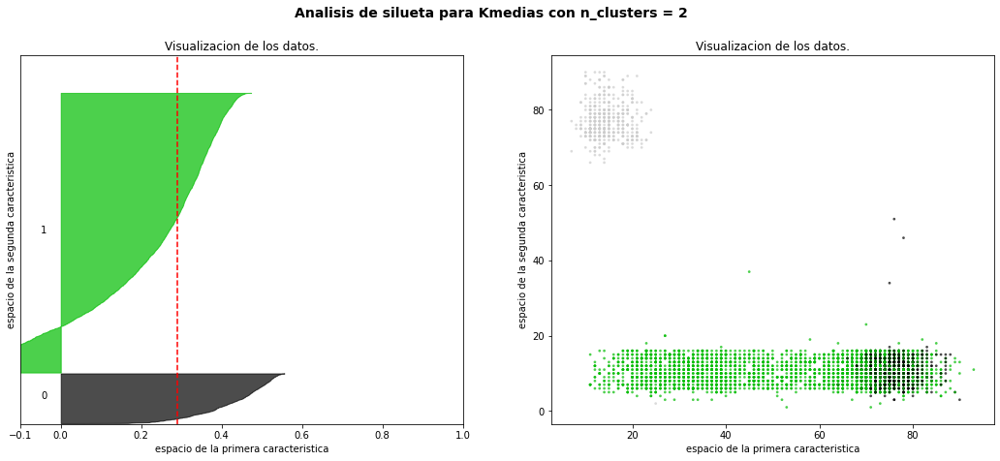

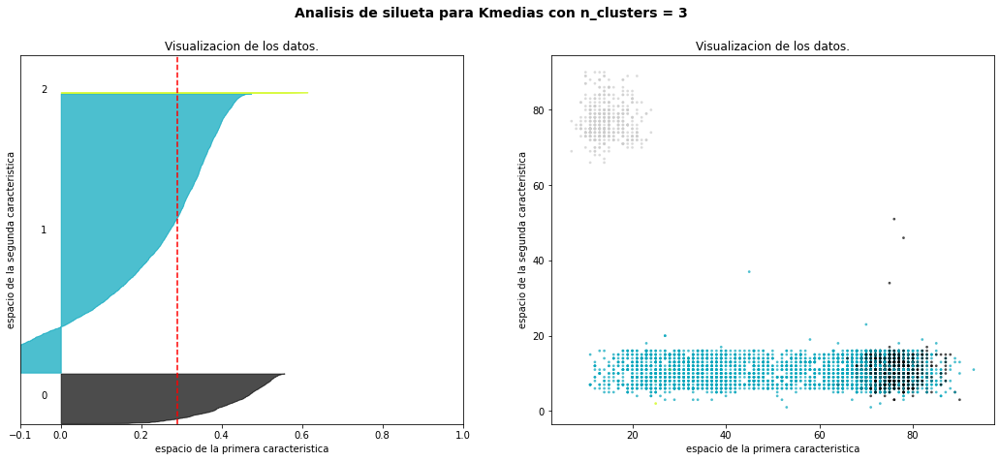

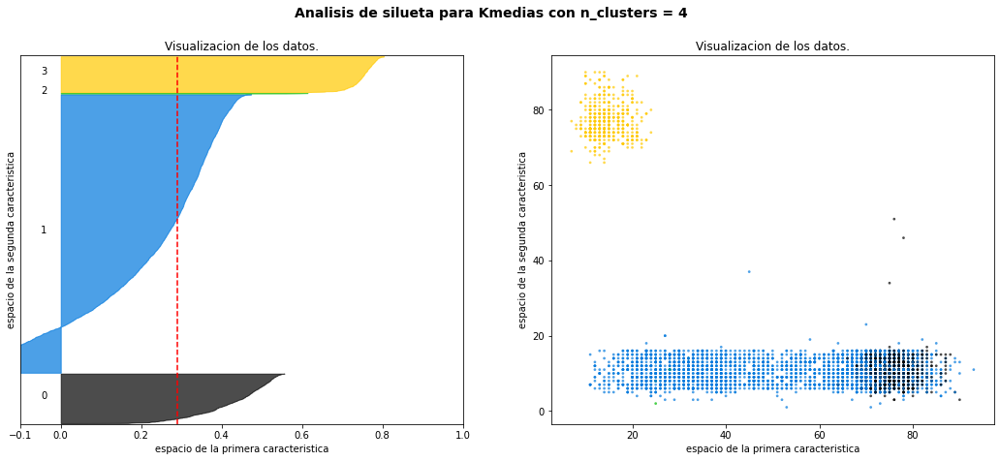

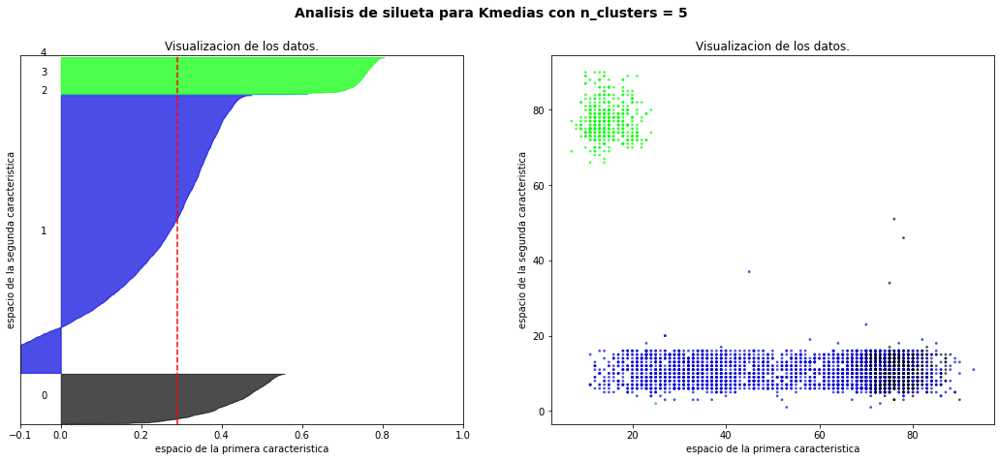

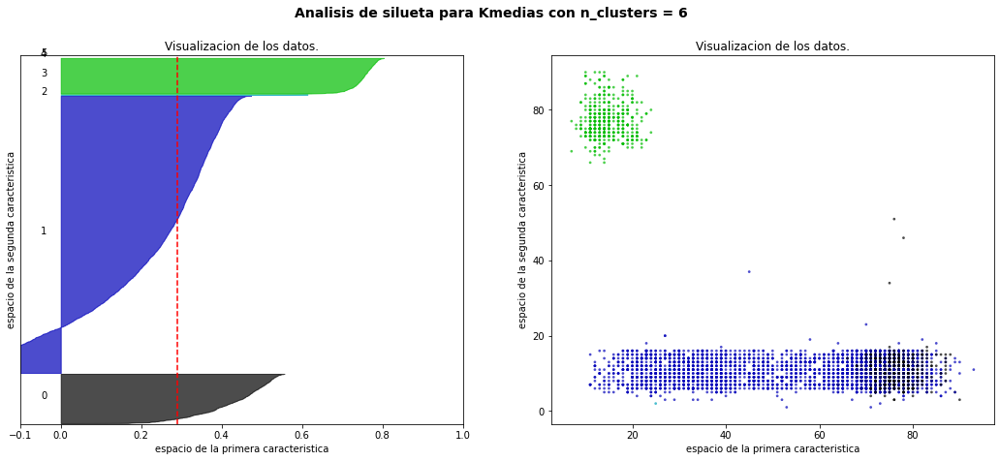

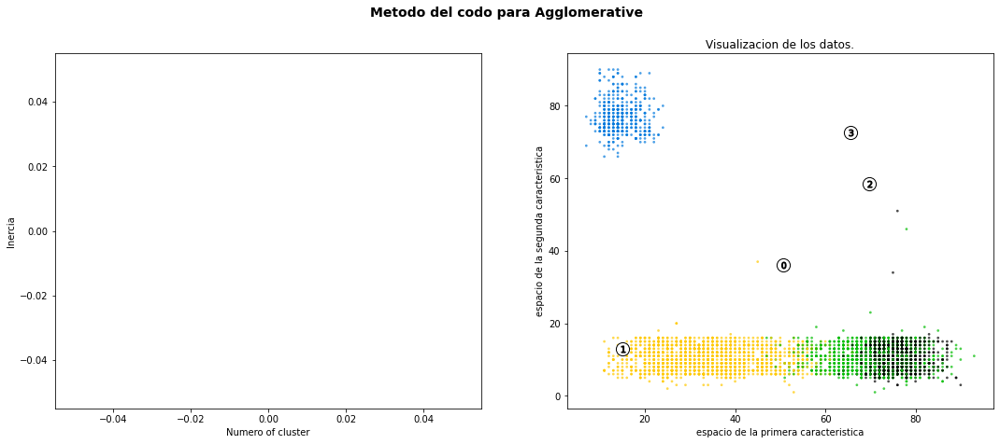

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
    cluster_labels = clusterer.fit_predict(df_skills)
    # sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #             c="white", alpha=1, s=200, edgecolor='k')

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                 s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para Agglomerative "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

### Resultados

**Se distingue claramente el cluster con los arqueros, los otros clusters importantes son el 0 y el 1, aunque no es muy buena su división**

In [ ]:
temp = df_n[bool_crack].groupby('Agglomerative').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  group = row.Agglomerative
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['K. Koulibaly', 'G. Chiellini']
Posiciones mayoritarias dentro del cluster 0
['LCB']

Ejemplo de "cracks" en cluster 1
['L. Messi', 'Cristiano Ronaldo', 'R. Lewandowski', 'Neymar Jr', 'K. De Bruyne']
Posiciones mayoritarias dentro del cluster 1
['LW', 'CAM', 'ST']

Ejemplo de "cracks" en cluster 3
['J. Oblak', 'M. ter Stegen', 'Alisson', 'T. Courtois', 'M. Neuer']
Posiciones mayoritarias dentro del cluster 3
['GK']



# 8.-Clustering-con-Agglomerative sin arqueros

In [ ]:
n=10000
df_n=df.loc[:n]
df_n=df_n[(df_n["player_positions"]!='GK')&(df_n['overall']>69)]

df_skills=df_n[skills_ratings]


In [ ]:
# Número de clusters buscado (mantenemos valor encontrado con el método del codo)
n_clust = 5

clustering = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
clustering.fit(df_skills)

clusters = clustering.labels_
#cluster_centers = clustering.cluster_centers_

labels_unique = np.unique(clusters)
n_clusters_ = len(labels_unique)

In [ ]:
df_n['Agglomerative_SA'] = clustering.labels_

In [ ]:
#Observaciones por cluster
df_n["Agglomerative_SA"].value_counts()

0    4181
3     670
2      10
1       4
4       4
Name: Agglomerative_SA, dtype: int64

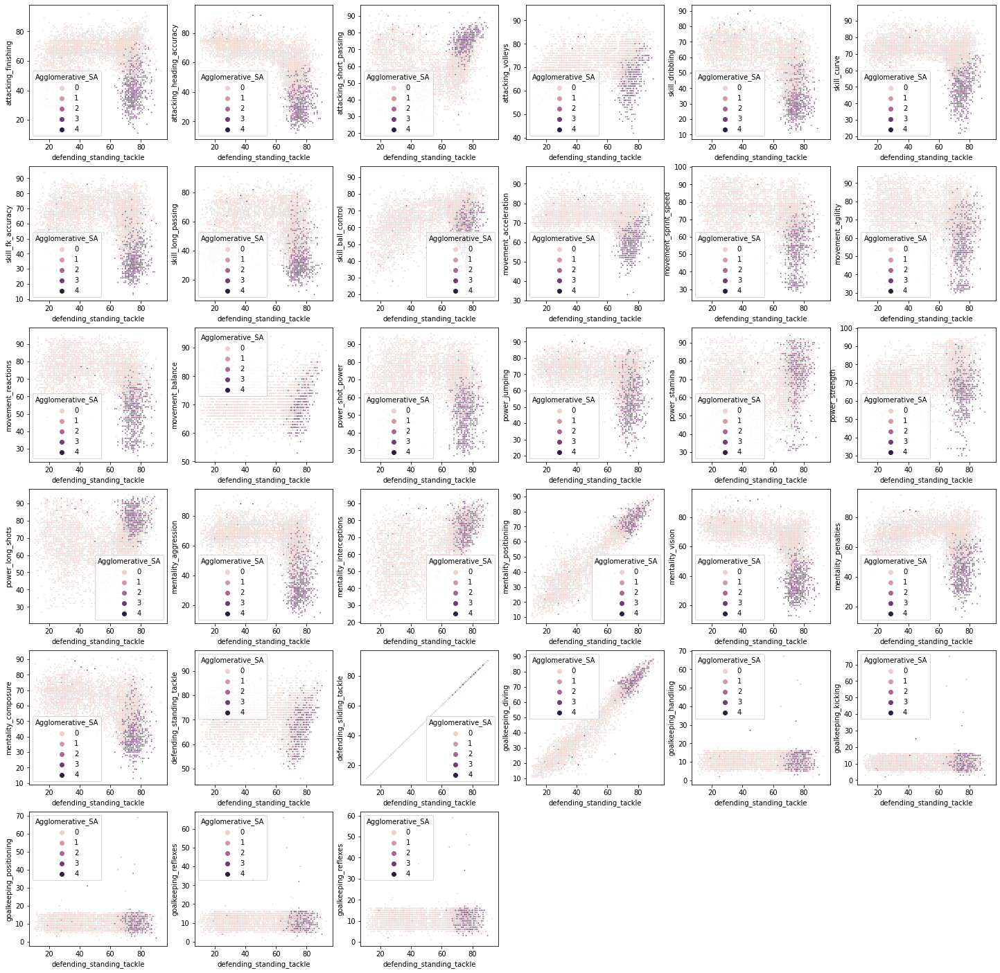

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Agglomerative_SA'], cmap = 'hsv_r')
    
plt.show()

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

In [ ]:
Agglomerative_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[Agglomerative_clusters,crack]

layout = go.Layout(title="Agglomerative",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4869 samples in 0.024s...
[t-SNE] Computed neighbors for 4869 samples in 1.105s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4869
[t-SNE] Computed conditional probabilities for sample 2000 / 4869
[t-SNE] Computed conditional probabilities for sample 3000 / 4869
[t-SNE] Computed conditional probabilities for sample 4000 / 4869
[t-SNE] Computed conditional probabilities for sample 4869 / 4869
[t-SNE] Mean sigma: 11.844459
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.490082
[t-SNE] KL divergence after 1000 iterations: 1.930613


In [ ]:
agglom_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[agglom_clusters,crack]

layout = go.Layout(title="Agglomerative - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

Para n_clusters = 2 El silhouette_score promedio es : 0.13367209446824185
Para n_clusters = 3 El silhouette_score promedio es : 0.13367209446824185
Para n_clusters = 4 El silhouette_score promedio es : 0.13367209446824185
Para n_clusters = 5 El silhouette_score promedio es : 0.13367209446824185
Para n_clusters = 6 El silhouette_score promedio es : 0.13367209446824185


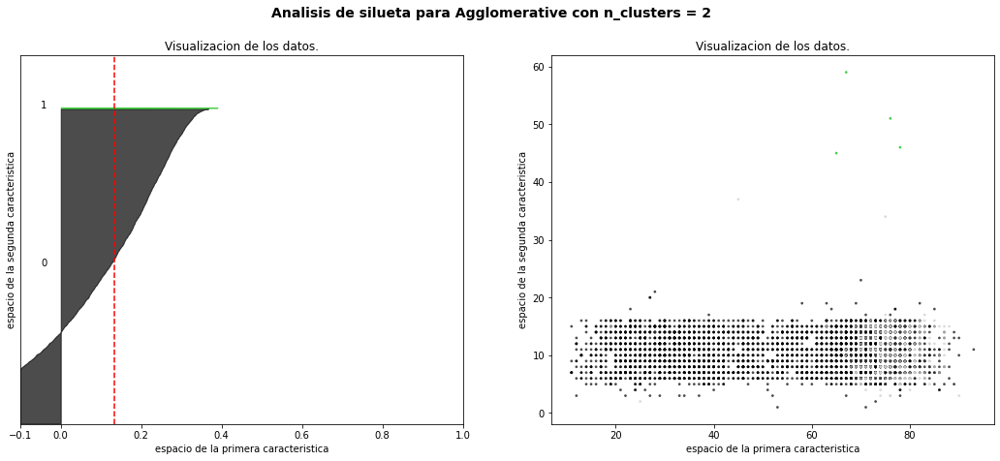

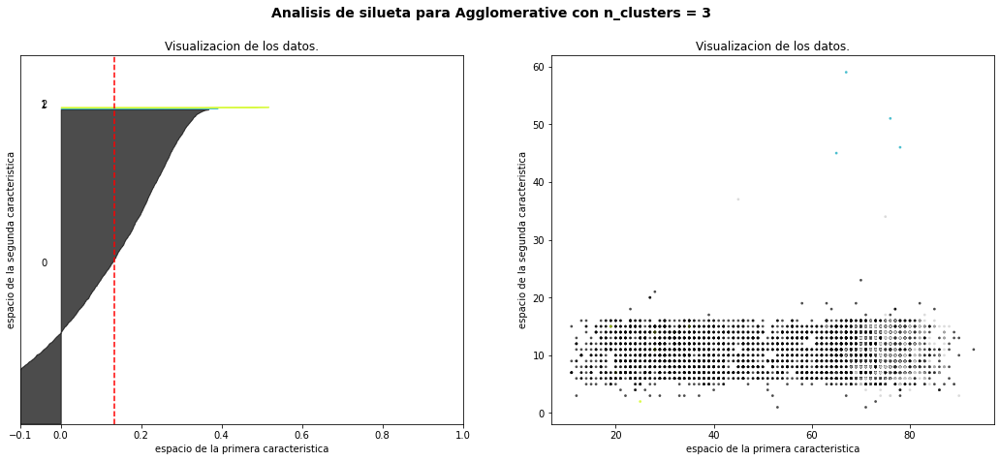

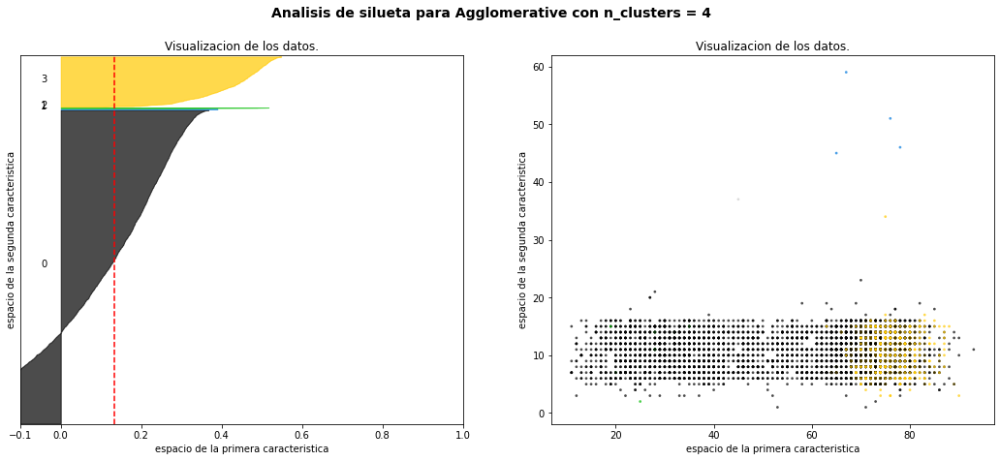

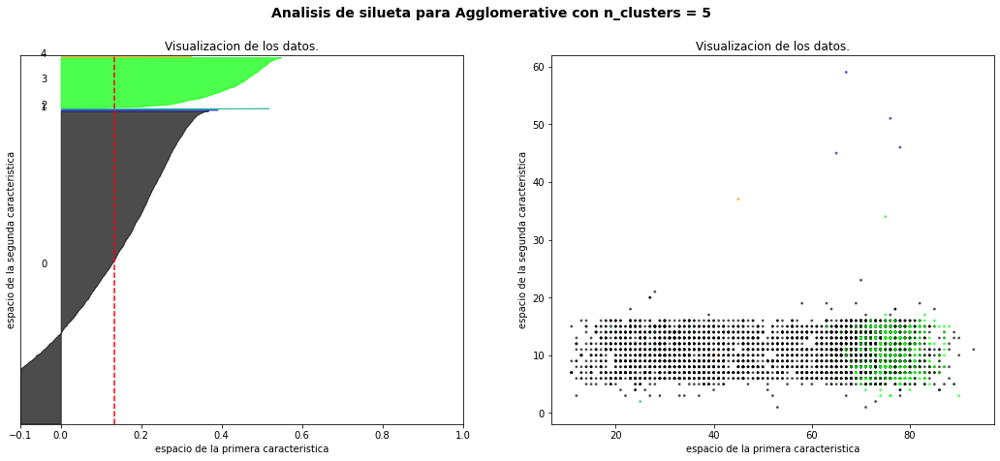

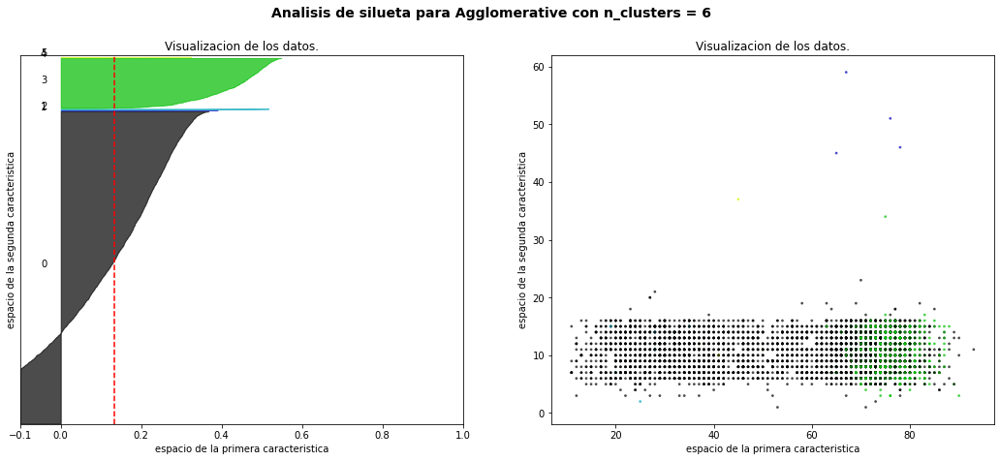

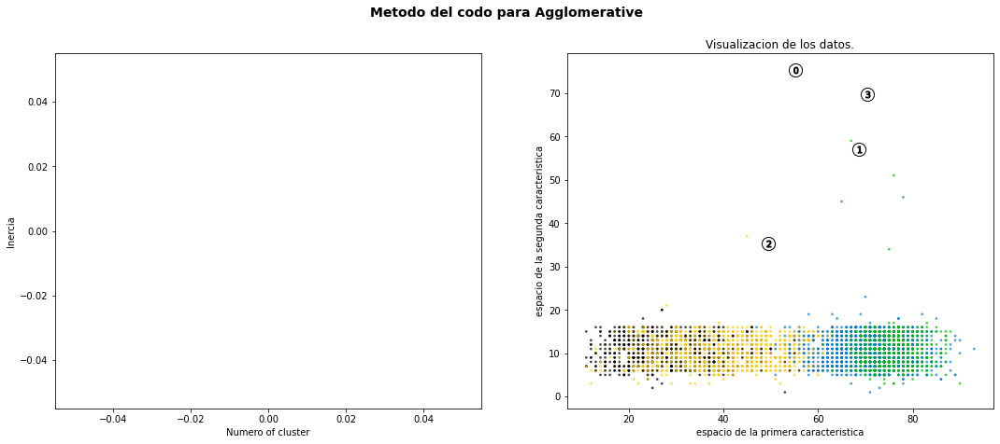

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
    cluster_labels = clusterer.fit_predict(df_skills)
    # sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #             c="white", alpha=1, s=200, edgecolor='k')

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                 s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Agglomerative "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para Agglomerative "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

### Resultados

**Las diferentes separaciones que hace de los datos no son muy buenas, genera un solo cluster grande con la mayoria de los jugadores, otro con una cantidad menor y el resto son solo observaciones aisladas**

In [ ]:
temp = df_n[bool_crack].groupby('Agglomerative_SA').agg({'short_name':list, 'team_position':list}).reset_index()
for ind, row in temp.iterrows():
  group = row.Agglomerative_SA
  player_list = row.short_name
  position_list = list(dict(Counter(row.team_position).most_common(3)))


  print(f'Ejemplo de "cracks" en cluster {group}')
  print(player_list[:5])
  print(f'Posiciones mayoritarias dentro del cluster {group}')
  print(position_list)
  print('='*50)
  print()

Ejemplo de "cracks" en cluster 0
['L. Messi', 'Cristiano Ronaldo', 'R. Lewandowski', 'Neymar Jr', 'K. De Bruyne']
Posiciones mayoritarias dentro del cluster 0
['LW', 'CAM', 'ST']

Ejemplo de "cracks" en cluster 3
['K. Koulibaly', 'G. Chiellini']
Posiciones mayoritarias dentro del cluster 3
['LCB']

Ejemplo de "cracks" en cluster 4
['L. Suárez', 'J. Vardy']
Posiciones mayoritarias dentro del cluster 4
['SUB', 'ST']



# Conclusiones

A partir de las pruebas con los distintos tipos de métodos de Clustering estos fueron los resultados:

**K-Means**: obtuvimos los mejores resultados con tanto al realizar el análisis con y sin arqueros.

**Mean-Shift:**: no logro generar ninguna separacion con significado dentro del conjunto de datos, ni siquiera diferenció los arqueros.

**Aglomerative**: logra separar los arqueros, pero el resto de los jugadores deja la mayoría juntos, solo separando un pequeño grupo de ellos.




Interpreción de los clusters (Incluyendo arqueros). 

Con la separacion hecha por kMeans podemos caracterizar a los clusters encontrados de la siguiente manera: 

**- Cluster 0** - Atacantes: Son los que arman el juego de ataques. Son los mejores en Crossing, Dribling, Curve, FK_Accuracy, BallControl, Acceleration, SprintSpeed, Agility, Balance.  Ejemplos de cracks en este grupo: 'L. Messi', 'Cristiano Ronaldo', 'R. Lewandowski', 'Neymar Jr', 'K. Mbappé'

**- Cluster 1** - Arqueros. Se diferencian claramente del resto de los jugadores en el tipo de habilidades que tienen. Ejemplos: 'J. Oblak', 'M. ter Stegen', 'Alisson', 'T. Courtois', 'M. Neuer'

**- Cluster 2** - Armadores: son muy buenos pasando la pelota. De hecho se detacan en Short y Long Passing. Tambien son los que tienen mas alta Stamina (fortaleza física y mental). Si bien no son los "mejores" en muchas categorías, tienen un buen rendimiento en casi todas.  Ejemplos: 'K. De Bruyne', 'V. van Dijk', 'Sergio Ramos', 'Casemiro', 'J. Kimmich'


**- Cluster 3** - Defensores: se destacan en Heading Accuracy, Jumping, Interceptions, Fortaleza, Agresión. 
Ejemplos: 'K. De Bruyne', 'V. van Dijk', 'Sergio Ramos', 'Casemiro', 'J. Kimmich'

In [ ]:
df_clusters

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,kmeans,MeanShift
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,#Dribbler #Distance Shooter #FK Specialist #Ac...,CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,Finesse Shot Long Shot Taker (AI) Speed Dribbl...,85,95,70,91,...,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,0,2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,#Aerial Threat #Dribbler #Distance Shooter #Ac...,LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,Power Free-Kick Flair Long Shot Taker (AI) Spe...,84,95,90,82,...,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3,0,2
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,90.0,52.0,90.0,GK Long Throw Comes For Crosses,13,11,15,43,...,67,88,49,59,78,41,78,12,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3,1,2
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,#Distance Shooter #Clinical Finisher,ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,Solid Player Finesse Shot Outside Foot Shot Ch...,71,94,85,84,...,77,93,82,89,84,76,86,85,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3,0,2
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,90000000,270000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,166500000.0,#Speedster #Dribbler #Playmaker #FK Specialist...,LW